In [4]:
import cv2
import glob


In [5]:
path=glob.glob("C:/Users/asus/Desktop/UNIVERSIDAD/PASANTIA/ANACONDA/JUPITERNOTEBOOK/poseswushuimages/gongbukunfu/gongbu_combinado/*.jpg")

In [6]:
for file in path:
    print(file)

C:/Users/asus/Desktop/UNIVERSIDAD/PASANTIA/ANACONDA/JUPITERNOTEBOOK/poseswushuimages/gongbukunfu/gongbu_combinado\gong bu kung fu10.jpg
C:/Users/asus/Desktop/UNIVERSIDAD/PASANTIA/ANACONDA/JUPITERNOTEBOOK/poseswushuimages/gongbukunfu/gongbu_combinado\gong bu kung fu11.jpg
C:/Users/asus/Desktop/UNIVERSIDAD/PASANTIA/ANACONDA/JUPITERNOTEBOOK/poseswushuimages/gongbukunfu/gongbu_combinado\gong bu kung fu12.jpg
C:/Users/asus/Desktop/UNIVERSIDAD/PASANTIA/ANACONDA/JUPITERNOTEBOOK/poseswushuimages/gongbukunfu/gongbu_combinado\gong bu kung fu17.jpg
C:/Users/asus/Desktop/UNIVERSIDAD/PASANTIA/ANACONDA/JUPITERNOTEBOOK/poseswushuimages/gongbukunfu/gongbu_combinado\gong bu kung fu18.jpg
C:/Users/asus/Desktop/UNIVERSIDAD/PASANTIA/ANACONDA/JUPITERNOTEBOOK/poseswushuimages/gongbukunfu/gongbu_combinado\gong bu kung fu2.jpg
C:/Users/asus/Desktop/UNIVERSIDAD/PASANTIA/ANACONDA/JUPITERNOTEBOOK/poseswushuimages/gongbukunfu/gongbu_combinado\gong bu kung fu28.jpg
C:/Users/asus/Desktop/UNIVERSIDAD/PASANTIA/ANACON

In [1]:
import math
import cv2
import numpy as np
from time import time
import mediapipe as mp
import matplotlib.pyplot as plt
# Initializing mediapipe pose class.
mp_pose = mp.solutions.pose

# Setting up the Pose function.
pose = mp_pose.Pose(static_image_mode=True, min_detection_confidence=0.3, model_complexity=2)

# Initializing mediapipe drawing class, useful for annotation.
mp_drawing = mp.solutions.drawing_utils

In [8]:
def calculateAngle(landmark1, landmark2, landmark3):
    '''
    This function calculates angle between three different landmarks.
    Args:
        landmark1: The first landmark containing the x,y and z coordinates.
        landmark2: The second landmark containing the x,y and z coordinates.
        landmark3: The third landmark containing the x,y and z coordinates.
    Returns:
        angle: The calculated angle between the three landmarks.

    '''

    # Get the required landmarks coordinates.
    x1, y1, _ = landmark1
    x2, y2, _ = landmark2
    x3, y3, _ = landmark3

    # Calculate the angle between the three points
    angle = math.degrees(math.atan2(y3 - y2, x3 - x2) - math.atan2(y1 - y2, x1 - x2))
    
    # Check if the angle is less than zero.
    if angle < 0:

        # Add 360 to the found angle.
        angle += 360
    
    # Return the calculated angle.
    return angle

In [9]:
def classifyPose(landmarks, output_image, display=False):
    '''
    This function classifies yoga poses depending upon the angles of various body joints.
    Args:
        landmarks: A list of detected landmarks of the person whose pose needs to be classified.
        output_image: A image of the person with the detected pose landmarks drawn.
        display: A boolean value that is if set to true the function displays the resultant image with the pose label 
        written on it and returns nothing.
    Returns:
        output_image: The image with the detected pose landmarks drawn and pose label written.
        label: The classified pose label of the person in the output_image.

    '''
    
    # Initialize the label of the pose. It is not known at this stage.
    label = 'Unknown Pose'

    # Specify the color (Red) with which the label will be written on the image.
    color = (0, 0, 255)
    
    # Calculate the required angles.
    #----------------------------------------------------------------------------------------------------------------
    
    # Get the angle between the left shoulder, elbow and wrist points. 
    left_elbow_angle = calculateAngle(landmarks[mp_pose.PoseLandmark.LEFT_SHOULDER.value],
                                      landmarks[mp_pose.PoseLandmark.LEFT_ELBOW.value],
                                      landmarks[mp_pose.PoseLandmark.LEFT_WRIST.value])
    
    # Get the angle between the right shoulder, elbow and wrist points. 
    right_elbow_angle = calculateAngle(landmarks[mp_pose.PoseLandmark.RIGHT_SHOULDER.value],
                                       landmarks[mp_pose.PoseLandmark.RIGHT_ELBOW.value],
                                       landmarks[mp_pose.PoseLandmark.RIGHT_WRIST.value])   
    
    # Get the angle between the left elbow, shoulder and hip points. 
    left_shoulder_angle = calculateAngle(landmarks[mp_pose.PoseLandmark.LEFT_ELBOW.value],
                                         landmarks[mp_pose.PoseLandmark.LEFT_SHOULDER.value],
                                         landmarks[mp_pose.PoseLandmark.LEFT_HIP.value])

    # Get the angle between the right hip, shoulder and elbow points. 
    right_shoulder_angle = calculateAngle(landmarks[mp_pose.PoseLandmark.RIGHT_HIP.value],
                                          landmarks[mp_pose.PoseLandmark.RIGHT_SHOULDER.value],
                                          landmarks[mp_pose.PoseLandmark.RIGHT_ELBOW.value])

    # Get the angle between the left hip, knee and ankle points. 
    left_knee_angle = calculateAngle(landmarks[mp_pose.PoseLandmark.LEFT_HIP.value],
                                     landmarks[mp_pose.PoseLandmark.LEFT_KNEE.value],
                                     landmarks[mp_pose.PoseLandmark.LEFT_ANKLE.value])

    # Get the angle between the right hip, knee and ankle points 
    right_knee_angle = calculateAngle(landmarks[mp_pose.PoseLandmark.RIGHT_HIP.value],
                                      landmarks[mp_pose.PoseLandmark.RIGHT_KNEE.value],
                                      landmarks[mp_pose.PoseLandmark.RIGHT_ANKLE.value])
    
    #----------------------------------------------------------------------------------------------------------------
    
    # Check if it is the warrior II pose or the T pose.
    # As for both of them, both arms should be straight and shoulders should be at the specific angle.
    #----------------------------------------------------------------------------------------------------------------
    
    # Check if the both arms are straight.
    if left_elbow_angle > 165 and left_elbow_angle < 195 and right_elbow_angle > 165 and right_elbow_angle < 195:

        # Check if shoulders are at the required angle.
        if left_shoulder_angle > 80 and left_shoulder_angle < 110 and right_shoulder_angle > 80 and right_shoulder_angle < 110:

    # Check if it is the warrior II pose.
    #----------------------------------------------------------------------------------------------------------------

            # Check if one leg is straight.
            if left_knee_angle > 165 and left_knee_angle < 195 or right_knee_angle > 165 and right_knee_angle < 195:

                # Check if the other leg is bended at the required angle.
                if left_knee_angle > 90 and left_knee_angle < 120 or right_knee_angle > 90 and right_knee_angle < 120:

                    # Specify the label of the pose that is Warrior II pose.
                    label = 'Warrior II Pose' 
                        
    #----------------------------------------------------------------------------------------------------------------
    
    # Check if it is the T pose.
    #----------------------------------------------------------------------------------------------------------------
    
            # Check if both legs are straight
            if left_knee_angle > 160 and left_knee_angle < 195 and right_knee_angle > 160 and right_knee_angle < 195:

                # Specify the label of the pose that is tree pose.
                label = 'T Pose'

    #----------------------------------------------------------------------------------------------------------------
    
    # Check if it is the tree pose.
    #----------------------------------------------------------------------------------------------------------------
    
    # Check if one leg is straight
    if left_knee_angle > 165 and left_knee_angle < 195 or right_knee_angle > 165 and right_knee_angle < 195:

        # Check if the other leg is bended at the required angle.
        if left_knee_angle > 315 and left_knee_angle < 335 or right_knee_angle > 25 and right_knee_angle < 45:

            # Specify the label of the pose that is tree pose.
            label = 'Tree Pose'
                
    #----------------------------------------------------------------------------------------------------------------
    
    # Check if the pose is classified successfully
    if label != 'Unknown Pose':
        
        # Update the color (to green) with which the label will be written on the image.
        color = (0, 255, 0)  
    
    # Write the label on the output image. 
    cv2.putText(output_image, label, (10, 30),cv2.FONT_HERSHEY_PLAIN, 2, color, 2)
    
    # Check if the resultant image is specified to be displayed.
    if display:
    
        # Display the resultant image.
        plt.figure(figsize=[10,10])
        plt.imshow(output_image[:,:,::-1]);plt.title("Output Image");plt.axis('off');
        
    else:
        
        # Return the output image and the classified label.
        return output_image, label

In [10]:
#2. CAPTURE LANDMARKS AND EXPORT TO CSV

In [10]:
#Nos ayudara a trabajar con csv y guardar nuestros datos ahi
import csv
#Nos ayudara en el orden de carpetas y almacenamiento, exportar a una estructura de datos especifica
import os
#Nos ayuda a trabajar con matrices numpy
import numpy as np

In [6]:
num_coords=33
num_coords

33

In [7]:
#Solo se ingresan el nombre de las columnas segun la cantidad de datos
#el class es para etiquetarlo segun lo que se esta haciendo
nombres=list(mp_pose.PoseLandmark)
landmarks=['class']
for val in range(1,num_coords+1):
    land=str(nombres[val-1])
    string_landmark = land.split(".")
    name=string_landmark[1]
    landmarks +=[name+"_"+'x{}'.format(val),name+"_"+'y{}'.format(val),name+"_"+'z{}'.format(val),name+"_"+'v{}'.format(val)]

In [8]:
landmarks

['class',
 'NOSE_x1',
 'NOSE_y1',
 'NOSE_z1',
 'NOSE_v1',
 'LEFT_EYE_INNER_x2',
 'LEFT_EYE_INNER_y2',
 'LEFT_EYE_INNER_z2',
 'LEFT_EYE_INNER_v2',
 'LEFT_EYE_x3',
 'LEFT_EYE_y3',
 'LEFT_EYE_z3',
 'LEFT_EYE_v3',
 'LEFT_EYE_OUTER_x4',
 'LEFT_EYE_OUTER_y4',
 'LEFT_EYE_OUTER_z4',
 'LEFT_EYE_OUTER_v4',
 'RIGHT_EYE_INNER_x5',
 'RIGHT_EYE_INNER_y5',
 'RIGHT_EYE_INNER_z5',
 'RIGHT_EYE_INNER_v5',
 'RIGHT_EYE_x6',
 'RIGHT_EYE_y6',
 'RIGHT_EYE_z6',
 'RIGHT_EYE_v6',
 'RIGHT_EYE_OUTER_x7',
 'RIGHT_EYE_OUTER_y7',
 'RIGHT_EYE_OUTER_z7',
 'RIGHT_EYE_OUTER_v7',
 'LEFT_EAR_x8',
 'LEFT_EAR_y8',
 'LEFT_EAR_z8',
 'LEFT_EAR_v8',
 'RIGHT_EAR_x9',
 'RIGHT_EAR_y9',
 'RIGHT_EAR_z9',
 'RIGHT_EAR_v9',
 'MOUTH_LEFT_x10',
 'MOUTH_LEFT_y10',
 'MOUTH_LEFT_z10',
 'MOUTH_LEFT_v10',
 'MOUTH_RIGHT_x11',
 'MOUTH_RIGHT_y11',
 'MOUTH_RIGHT_z11',
 'MOUTH_RIGHT_v11',
 'LEFT_SHOULDER_x12',
 'LEFT_SHOULDER_y12',
 'LEFT_SHOULDER_z12',
 'LEFT_SHOULDER_v12',
 'RIGHT_SHOULDER_x13',
 'RIGHT_SHOULDER_y13',
 'RIGHT_SHOULDER_z13',
 'RIG

In [9]:
#Ingresando todos los datos a un csv
#En el csv saldra una linea junta con comas, se puede convertir de texto a columnas con el delimitante
path_csv='myvideo/p1.csv'
with open(path_csv,mode='w',newline='') as f:
    csv_writer=csv.writer(f,delimiter=',', quotechar='"',quoting=csv.QUOTE_MINIMAL)
    csv_writer.writerow(landmarks)

In [12]:
#determinando que gestos haremos
class_name="Normal"

In [13]:
def detectPose(image, pose, display=True):
    '''
    This function performs pose detection on an image.
    Args:
        image: The input image with a prominent person whose pose landmarks needs to be detected.
        pose: The pose setup function required to perform the pose detection.
        display: A boolean value that is if set to true the function displays the original input image, the resultant image, 
                 and the pose landmarks in 3D plot and returns nothing.
    Returns:
        output_image: The input image with the detected pose landmarks drawn.
        landmarks: A list of detected landmarks converted into their original scale.
    '''
    
    # Create a copy of the input image.
    output_image = image.copy()
    
    # Convert the image from BGR into RGB format.
    imageRGB = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Perform the Pose Detection.
    results = pose.process(imageRGB)
    
    # Retrieve the height and width of the input image.
    height, width, _ = image.shape
    
    # Initialize a list to store the detected landmarks.
    landmarks = []
    
    # Check if any landmarks are detected.
    if results.pose_landmarks:
    
        # Draw Pose landmarks on the output image.
        mp_drawing.draw_landmarks(image=output_image, landmark_list=results.pose_landmarks,
                                  connections=mp_pose.POSE_CONNECTIONS)
        
        
        pose=results.pose_landmarks.landmark
        pose_row=list(np.array([[landmark.x,landmark.y,landmark.z,landmark.visibility] for landmark in pose]).flatten())
         
        row=pose_row
        row.insert(0,class_name)
    
        #es practicamente el mismo codigo que arriba solo que para adicionar y no crear otro
        #se pone a
        with open('myvideo/poses.csv',mode='a',newline='') as f:
            csv_writer=csv.writer(f,delimiter=',', quotechar='"',quoting=csv.QUOTE_MINIMAL)
            csv_writer.writerow(row)
        
        
        # Iterate over the detected landmarks.
        for landmark in results.pose_landmarks.landmark:
            
            # Append the landmark into the list.
            landmarks.append((int(landmark.x * width), int(landmark.y * height),
                                  (landmark.z * width)))
            

            
    
    # Check if the original input image and the resultant image are specified to be displayed.
    if display:
    
        # Display the original input image and the resultant image.
        plt.figure(figsize=[22,22])
        plt.subplot(121);plt.imshow(image[:,:,::-1]);plt.title("Original Image");plt.axis('off');
        plt.subplot(122);plt.imshow(output_image[:,:,::-1]);plt.title("Output Image");plt.axis('off');
        
        # Also Plot the Pose landmarks in 3D.
        mp_drawing.plot_landmarks(results.pose_world_landmarks, mp_pose.POSE_CONNECTIONS)
        
    # Otherwise
    else:
        
        # Return the output image and the found landmarks.
        return output_image, landmarks

C:\Users\asus\anaconda3\lib\site-packages\ipykernel_launcher.py:118: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


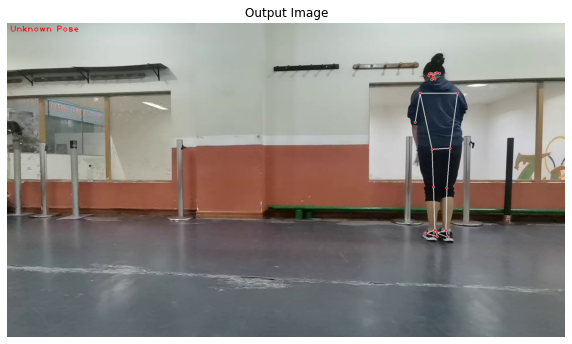

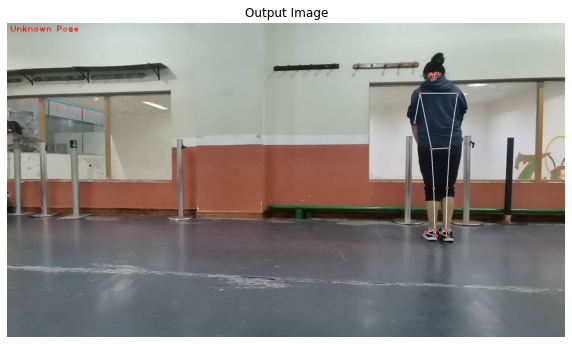

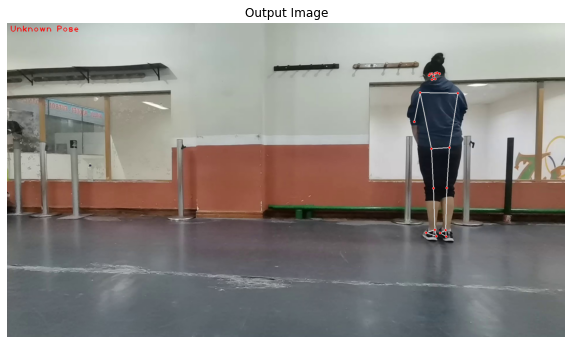

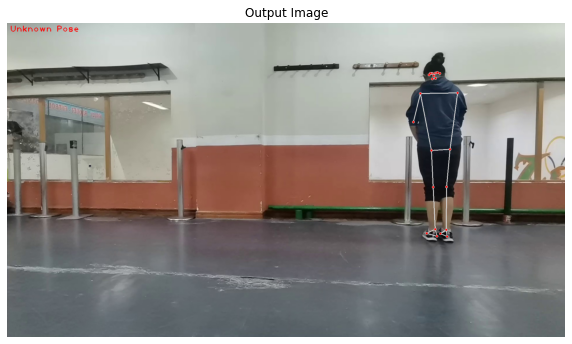

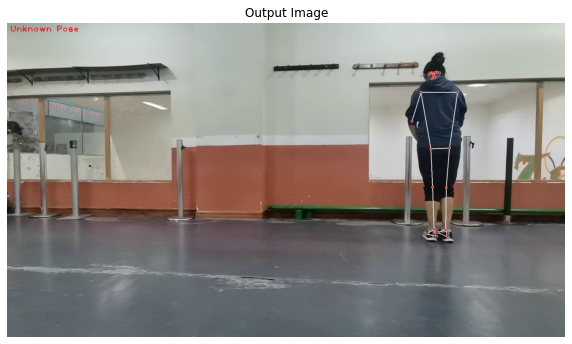

...

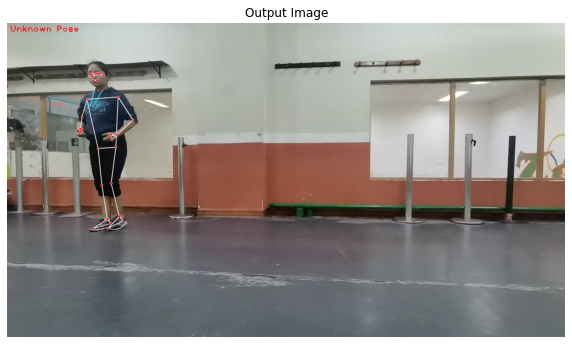

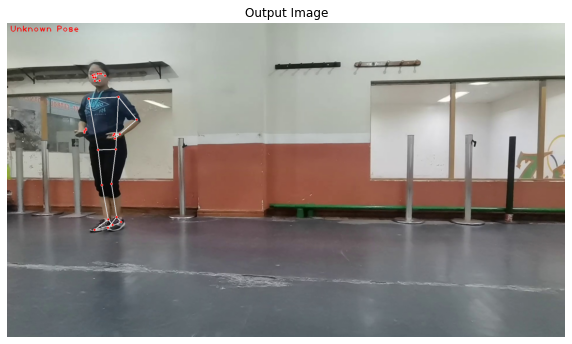

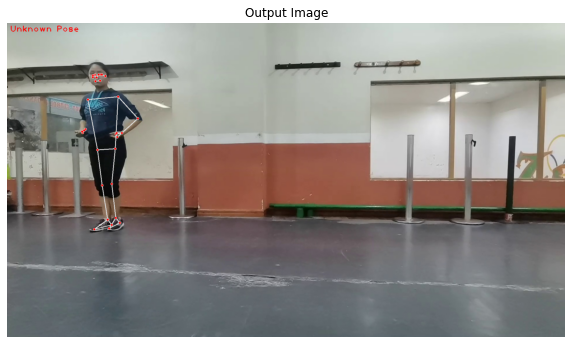

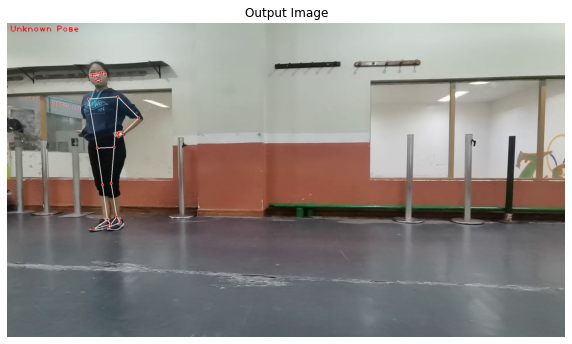

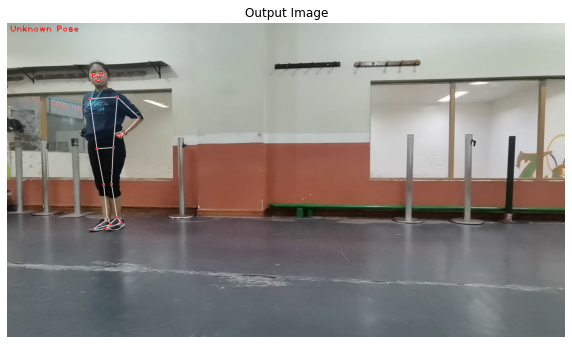

In [20]:
# Read a sample image and perform pose classification on it.
path=glob.glob("C:/Users/asus/Desktop/UNIVERSIDAD/PASANTIA/ANACONDA/JUPITERNOTEBOOK/myvideo/imagenes/combinacion_cortes/posturas/corte7/normal/*.jpg")

for file in path:
    image = cv2.imread(file)
    #image = cv2.imread('media/warriorIIpose.jpg')
    output_image, landmarks = detectPose(image, pose, display=False)
    if landmarks:
        classifyPose(landmarks, output_image, display=True)

In [8]:
#3. TRAIN CUSTOM MODEL USING SCIKIT LEARN
#READ IN COLLECTED DATA AND PROCESS
#Manejamos pandas para los datos tabulados
import pandas as pd
#para divir los datos de entrenamiento y los de prueba
from sklearn.model_selection import train_test_split

In [9]:
#Importando los datos de nuestro dataset 
df=pd.read_csv('myvideo/poses.csv')

In [12]:
df.head()

,class,NOSE_x1,NOSE_y1,NOSE_z1,NOSE_v1,LEFT_EYE_INNER_x2,LEFT_EYE_INNER_y2,LEFT_EYE_INNER_z2,LEFT_EYE_INNER_v2,LEFT_EYE_x3,...,RIGHT_HEEL_z31,RIGHT_HEEL_v31,LEFT_FOOT_INDEX_x32,LEFT_FOOT_INDEX_y32,LEFT_FOOT_INDEX_z32,LEFT_FOOT_INDEX_v32,RIGHT_FOOT_INDEX_x33,RIGHT_FOOT_INDEX_y33,RIGHT_FOOT_INDEX_z33,RIGHT_FOOT_INDEX_v33
0,Mabu,0.338949,0.267868,-0.192381,0.999615,0.338756,0.255450,-0.176463,0.998945,0.339873,...,-0.020487,0.909678,0.404543,0.637727,0.067369,0.985126,0.245939,0.678501,-0.097650,0.986881
1,Mabu,0.341362,0.272906,-0.172833,0.999878,0.341833,0.263022,-0.157755,0.999648,0.342892,...,-0.019190,0.903474,0.403932,0.632878,0.042807,0.983703,0.245826,0.677713,-0.090687,0.986446
2,Mabu,0.343300,0.273654,-0.145198,0.999949,0.343889,0.264594,-0.129308,0.999866,0.345471,...,-0.017373,0.907558,0.402237,0.634145,0.046420,0.964670,0.245234,0.675632,-0.082495,0.982250
3,Mabu,0.341744,0.275978,-0.036437,1.000000,0.344508,0.270824,-0.024877,0.999999,0.346587,...,0.001984,0.491569,0.401018,0.631583,0.017119,0.583191,0.246674,0.672462,-0.047516,0.739743
4,Mabu,0.344600,0.279687,-0.137207,0.999933,0.345614,0.269513,-0.122338,0.999876,0.347535,...,-0.019327,0.955203,0.403115,0.635911,0.015902,0.975587,0.243256,0.677595,-0.082133,0.988185


In [13]:
df.columns

Index(['class', 'NOSE_x1', 'NOSE_y1', 'NOSE_z1', 'NOSE_v1',
       'LEFT_EYE_INNER_x2', 'LEFT_EYE_INNER_y2', 'LEFT_EYE_INNER_z2',
       'LEFT_EYE_INNER_v2', 'LEFT_EYE_x3',
       ...
       'RIGHT_HEEL_z31', 'RIGHT_HEEL_v31', 'LEFT_FOOT_INDEX_x32',
       'LEFT_FOOT_INDEX_y32', 'LEFT_FOOT_INDEX_z32', 'LEFT_FOOT_INDEX_v32',
       'RIGHT_FOOT_INDEX_x33', 'RIGHT_FOOT_INDEX_y33', 'RIGHT_FOOT_INDEX_z33',
       'RIGHT_FOOT_INDEX_v33'],
      dtype='object', length=133)

In [26]:
X=df.drop('class',axis=1)#features
y=df['class']#target value

In [27]:
#Esa parte es solo extraer los datos que nuestra diviison de prueba 
X_train, X_test, y_train, y_test=train_test_split(X,y,test_size=0.3,random_state=1234)

In [28]:
X_train

,x1,y1,z1,v1,x2,y2,z2,v2,x3,y3,...,z31,v31,x32,y32,z32,v32,x33,y33,z33,v33
218,0.322046,0.306359,-0.019826,0.999928,0.326200,0.296564,-0.024635,0.999855,0.327507,0.296679,...,0.070079,0.985336,0.388691,0.686498,-0.449024,0.999016,0.293093,0.645582,0.017766,0.990483
571,0.164235,0.271012,-0.081375,0.999800,0.168805,0.260708,-0.089622,0.999420,0.170049,0.260876,...,0.300669,0.974135,0.219091,0.670625,0.040264,0.970376,0.136465,0.654123,0.274720,0.980823
170,0.325835,0.319003,-0.105402,1.000000,0.324562,0.308009,-0.092120,1.000000,0.324858,0.307603,...,-0.162873,0.999828,0.278622,0.651014,0.349087,0.995920,0.358071,0.696843,-0.189937,0.999925
697,0.905198,0.057928,0.197764,0.998871,0.901628,0.045131,0.172650,0.998767,0.899041,0.044680,...,-0.002940,0.959292,0.881689,0.699992,0.222821,0.683905,0.936100,0.752989,-0.023426,0.837108
298,0.489896,0.272943,-0.113796,0.993866,0.495384,0.262528,-0.114253,0.988372,0.496808,0.262938,...,0.093608,0.856234,0.605980,0.687583,-0.048737,0.945686,0.409819,0.673854,0.032926,0.927461
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
204,0.461262,0.269803,0.189267,0.999992,0.460686,0.259115,0.166073,0.999993,0.458853,0.259027,...,0.022697,0.996000,0.401154,0.677379,0.321950,0.913835,0.582271,0.752093,0.021784,0.988399
53,0.360151,0.284751,-0.092746,0.998465,0.356296,0.275991,-0.079660,0.994066,0.355782,0.276290,...,-0.014699,0.753452,0.408780,0.633417,0.057701,0.919461,0.247480,0.680516,-0.070780,0.897457
294,0.504729,0.241005,-0.130771,0.998509,0.510388,0.230485,-0.130688,0.996848,0.511869,0.231313,...,0.088606,0.953283,0.606876,0.690331,-0.061710,0.990278,0.411114,0.677434,0.009914,0.987260
723,0.516166,0.207177,0.016276,0.992612,0.513665,0.199441,0.012002,0.993168,0.511956,0.199228,...,0.003602,0.911644,0.557507,0.445987,0.422621,0.157076,0.544630,0.643008,-0.038547,0.893142


In [4]:
#Estas dirigidos a una canalizacion o a generar a pipeline de aprendizaje
#automatico, esta configuracion se usara tanto para el entrenamiento como test
from sklearn.pipeline import make_pipeline
#Normaliza los datos, resta los datos y los divide por la desv estandar
from sklearn.preprocessing import StandardScaler
#Estos son algoritmos de clasificacion se usara 4 para clasificar
from sklearn.linear_model import LogisticRegression, RidgeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier

In [ ]:
#hay que pensar que cada uno es como un modelo individual
pipelines={
    'lr':make_pipeline(StandardScaler(),LogisticRegression()),
    'rc':make_pipeline(StandardScaler(),RidgeClassifier()),
    'rf':make_pipeline(StandardScaler(),RandomForestClassifier()),
    'gb':make_pipeline(StandardScaler(),GradientBoostingClassifier()),  
    
}

In [31]:
#es como un diccionario
pipelines.keys()

dict_keys(['lr', 'rc', 'rf', 'gb'])

In [32]:
fit_models={}
#estamos recorriendo cada uno de nuestros pipelines
for algo, pipeline in pipelines.items():
    #hacemos el ajuste de puntos para entrenar bien
    #se almacenara en una variable modelo y se lo guardara
    #en nuestro diccionario
    model=pipeline.fit(X_train, y_train)
    fit_models[algo]=model

C:\Users\asus\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


In [33]:
fit_models

{'lr': Pipeline(memory=None,
          steps=[('standardscaler',
                  StandardScaler(copy=True, with_mean=True, with_std=True)),
                 ('logisticregression',
                  LogisticRegression(C=1.0, class_weight=None, dual=False,
                                     fit_intercept=True, intercept_scaling=1,
                                     l1_ratio=None, max_iter=100,
                                     multi_class='auto', n_jobs=None,
                                     penalty='l2', random_state=None,
                                     solver='lbfgs', tol=0.0001, verbose=0,
                                     warm_start=False))],
          verbose=False),
 'rc': Pipeline(memory=None,
          steps=[('standardscaler',
                  StandardScaler(copy=True, with_mean=True, with_std=True)),
                 ('ridgeclassifier',
                  RidgeClassifier(alpha=1.0, class_weight=None, copy_X=True,
                                  fit_inter

In [34]:
#Prueba de prediccion
fit_models['rf'].predict(X_test)

array(['Normal', 'Normal', 'Normal', 'Xubu', 'Mabu', 'Normal', 'Gongbu',
       'Pubu', 'Mabu', 'Mabu', 'Normal', 'Mabu', 'Normal', 'Normal',
       'Mabu', 'Gongbu', 'Normal', 'Mabu', 'Mabu', 'Xiebu', 'Pubu',
       'Mabu', 'Mabu', 'Mabu', 'Mabu', 'Mabu', 'Normal', 'Mabu', 'Normal',
       'Normal', 'Normal', 'Normal', 'Normal', 'Normal', 'Mabu', 'Normal',
       'Normal', 'Mabu', 'Xubu', 'Mabu', 'Normal', 'Mabu', 'Pubu',
       'Gongbu', 'Mabu', 'Normal', 'Mabu', 'Mabu', 'Mabu', 'Normal',
       'Normal', 'Normal', 'Pubu', 'Mabu', 'Normal', 'Mabu', 'Mabu',
       'Mabu', 'Normal', 'Normal', 'Normal', 'Gongbu', 'Mabu', 'Gongbu',
       'Normal', 'Normal', 'Normal', 'Xubu', 'Normal', 'Gongbu', 'Xiebu',
       'Normal', 'Mabu', 'Normal', 'Normal', 'Gongbu', 'Normal', 'Mabu',
       'Gongbu', 'Normal', 'Mabu', 'Gongbu', 'Xiebu', 'Normal', 'Mabu',
       'Normal', 'Normal', 'Normal', 'Xiebu', 'Pubu', 'Mabu', 'Normal',
       'Gongbu', 'Gongbu', 'Normal', 'Mabu', 'Mabu', 'Mabu', 'Gongbu',


In [ ]:
#3.3 EVALUATE AND SERIALIZE MODEL
#Pensar serializar como guardar efectivamente el modelo, usaremos una libreria

In [11]:
#importando la precision de prediccion
from sklearn.metrics import accuracy_score
#pickle es una libreria que se utiliza para guardar los modelos en el disco
import pickle

In [3]:
#recorremos cada modelo del diccionario enviandole el X_test
#para que hagan predicciones y se almacena los resultados dentro de
#una variable llamada yhat
for algo,model in fit_models.items():
    yhat=model.predict(X_test)
    print(algo, accuracy_score(y_test,yhat))

NameError: name 'fit_models' is not defined

In [37]:
#Comparando las etiquetas reconocidas con los valores
fit_models['rf'].predict(X_test)

array(['Normal', 'Normal', 'Normal', 'Xubu', 'Mabu', 'Normal', 'Gongbu',
       'Pubu', 'Mabu', 'Mabu', 'Normal', 'Mabu', 'Normal', 'Normal',
       'Mabu', 'Gongbu', 'Normal', 'Mabu', 'Mabu', 'Xiebu', 'Pubu',
       'Mabu', 'Mabu', 'Mabu', 'Mabu', 'Mabu', 'Normal', 'Mabu', 'Normal',
       'Normal', 'Normal', 'Normal', 'Normal', 'Normal', 'Mabu', 'Normal',
       'Normal', 'Mabu', 'Xubu', 'Mabu', 'Normal', 'Mabu', 'Pubu',
       'Gongbu', 'Mabu', 'Normal', 'Mabu', 'Mabu', 'Mabu', 'Normal',
       'Normal', 'Normal', 'Pubu', 'Mabu', 'Normal', 'Mabu', 'Mabu',
       'Mabu', 'Normal', 'Normal', 'Normal', 'Gongbu', 'Mabu', 'Gongbu',
       'Normal', 'Normal', 'Normal', 'Xubu', 'Normal', 'Gongbu', 'Xiebu',
       'Normal', 'Mabu', 'Normal', 'Normal', 'Gongbu', 'Normal', 'Mabu',
       'Gongbu', 'Normal', 'Mabu', 'Gongbu', 'Xiebu', 'Normal', 'Mabu',
       'Normal', 'Normal', 'Normal', 'Xiebu', 'Pubu', 'Mabu', 'Normal',
       'Gongbu', 'Gongbu', 'Normal', 'Mabu', 'Mabu', 'Mabu', 'Gongbu',


In [38]:
y_test

766    Normal
681    Normal
945    Normal
555      Xubu
202      Mabu
        ...  
373    Gongbu
216      Mabu
579      Xubu
96       Mabu
785    Normal
Name: class, Length: 298, dtype: object

In [39]:
#creamos un archivo .pkl para guardar el modelo
#y le pasamos el modelo a guardar
import pickle
with open('myvideo/prediction_wushu.pkl','wb') as f:
    pickle.dump(fit_models['gb'],f)

In [40]:
#-------------------------HASTA AQUI EL PROCESAMIENTO-------------------------------------

In [41]:
#4.MAKE DETECTIONS WITH MODEL
#-----------------------------------------

In [ ]:
import math
import cv2
import numpy as np
from time import time
import mediapipe as mp
import matplotlib.pyplot as plt
# Initializing mediapipe pose class.
mp_pose = mp.solutions.pose

# Setting up the Pose function.
pose = mp_pose.Pose(static_image_mode=True, min_detection_confidence=0.3, model_complexity=2)

# Initializing mediapipe drawing class, useful for annotation.
mp_drawing = mp.solutions.drawing_utils

In [ ]:
#3. TRAIN CUSTOM MODEL USING SCIKIT LEARN
#READ IN COLLECTED DATA AND PROCESS
#Manejamos pandas para los datos tabulados
import pandas as pd
#para divir los datos de entrenamiento y los de prueba
from sklearn.model_selection import train_test_split

In [ ]:
#importando la precision de prediccion
from sklearn.metrics import accuracy_score
#pickle es una libreria que se utiliza para guardar los modelos en el disco
import pickle

In [ ]:
#Nos ayudara a trabajar con csv y guardar nuestros datos ahi
import csv
#Nos ayudara en el orden de carpetas y almacenamiento, exportar a una estructura de datos especifica
import os
#Nos ayuda a trabajar con matrices numpy
import numpy as np

In [17]:
#abrimos el modelo guardado
#el segundo parametro es read binary
with open(r'C:\Users\asus\Desktop\UNIVERSIDAD\PASANTIA\ANACONDA\JUPITERNOTEBOOK\myvideo\prediction_wushu.pkl','rb') as f:
    model=pickle.load(f)

In [18]:
model

Pipeline(memory=None,
         steps=[('standardscaler',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('randomforestclassifier',
                 RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                        class_weight=None, criterion='gini',
                                        max_depth=None, max_features='auto',
                                        max_leaf_nodes=None, max_samples=None,
                                        min_impurity_decrease=0.0,
                                        min_impurity_split=None,
                                        min_samples_leaf=1, min_samples_split=2,
                                        min_weight_fraction_leaf=0.0,
                                        n_estimators=100, n_jobs=None,
                                        oob_score=False, random_state=None,
                                        verbose=0, warm_start=False))],
         verbose=F

In [20]:
mp_drawing=mp.solutions.drawing_utils #drawing helpers
#se obtiene el modelo 
mp_holistic=mp.solutions.holistic  #mediapipe solutions
#3. APLICANDO ESTILO Y CAMBIO DE COLORES AL MODELO
#1. GET REALTIME WEBCAM FEED------------------------------
#capturamos el dispositivo y le pasamos el numero de dispositivo del webcam
#VIDEO FEED
#cap=cv2.VideoCapture(0)
nombre='wushu2.mp4'
# Initialize the VideoCapture object to read from a video stored in the disk.
cap = cv2.VideoCapture('myvideo/examples/'+nombre)

#Para grabar el videooooooooooooooooooooooo
fps = cap.get(cv2.CAP_PROP_FPS)      # OpenCV2 version 2 used "CV_CAP_PROP_FPS"
frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
duration = frame_count/fps

frame_counter = 0

# Set video camera size
cap.set(3,1280)
cap.set(4,960)

#Grabando video
frame_width = int(cap.get(3))
frame_height = int(cap.get(4))
 
# Define the codec and create VideoWriter object.The output is stored in 'outpy.avi' file.
#GUARDAR en mp4 

#out = cv2.VideoWriter('wushubasic/mayorporcentaje/'+nombre,cv2.VideoWriter_fourcc('m','p','4','v'), 10, (frame_width,frame_height))
out = cv2.VideoWriter('myvideo/videos/'+nombre,cv2.VideoWriter_fourcc('m','p','4','v'), 10, (frame_width,frame_height))
#------------------------------------------


#estamos configurnado e ingresando a nuestro modelo holistico
#se especifica qeu tan buena es la deteccion y seguimineto y 
#todo lo ponemos en holistic para trabajar con ello 
with mp_holistic.Holistic(min_detection_confidence=0.5,min_tracking_confidence=0.5) as holistic:
    # mientras nuesro dispositovo de caputra este abierto 
    while cap.isOpened():
        #leyendo el feed de la camara
        ret,frame=cap.read();
        
        if ret==True:
            #Recoloreando de bgr a rgb para enviar los datos
            #de manera correcta
            #cuando lo usamos con opencv utilizamos bgr pero para enviarlo 
            #la modelo holistico requerimos rgb
            image=cv2.cvtColor(frame,cv2.COLOR_BGR2RGB)
            image.flags.writeable=False

            #Realizando decisiones
            results=holistic.process(image)
          #  print(results.face_landmarks)

            #Comenzamos a devolverlo a su color para luego pintarlo encima de 
            #la imagen con opencv YA QUE SINO TIENE UNA COLORACION EXTRA;A
            image.flags.writeable=True
            image=cv2.cvtColor(image,cv2.COLOR_RGB2BGR)

            #Dibujando las marcas de la cara 
            #Se cambio el llamado de FACE_CONNECTIONS a facemesh_contourS, FACEMESH_TESSELATI      
            #POSE DETECTION
            mp_drawing.draw_landmarks(image, results.pose_landmarks, mp_holistic.POSE_CONNECTIONS,
                                     mp_drawing.DrawingSpec(color=(245,117,66),thickness=2, circle_radius=4)
                                    ,mp_drawing.DrawingSpec(color=(245,66,230),thickness=2, circle_radius=2))



            #Export coordinates
            #Colocando todos los datos en un array y que esten en la misma linea
            try:
                #Almacenamos todos los resultados de pose de landmarks en una variable
                #Para el array obtenemos cada valor usamos un for para ir por cada uno y usamos flatten para poner
                #los valores en una sola cadena
                #si se quita flatten tendra varias matrices en una pequenia matriz
                pose=results.pose_landmarks.landmark
                pose_row=list(np.array([[landmark.x,landmark.y,landmark.z,landmark.visibility] for landmark in pose]).flatten())

                row=pose_row
              #  row.insert(0,class_name)

                #es practicamente el mismo codigo que arriba solo que para adicionar y no crear otro
                #se pone a
             #   with open('coordenadass.csv',mode='a',newline='') as f:
              #      csv_writer=csv.writer(f,delimiter=',', quotechar='"',quoting=csv.QUOTE_MINIMAL)
              #      csv_writer.writerow(row)
                #Haciendo las detecciones
                #ponemos el row que es el conjunto de datos en una variable X en formato frame
                X=pd.DataFrame([row])
                #Obtenemos el valor 0 de este frame y hacemos como arriba la prediccion
                #este valor X es la concatenacion sin el label de clase
                body_language_class=model.predict(X)[0]
                body_language_prob=model.predict_proba(X)[0]
               # print(body_language_class, body_language_prob)

                #Grab ear coords
                #Estamos tomando las coordenadas de la oreja ya que ahi pondremos
                #la clase
                #en la primera parte obtenemos los datos y lo pasamos a una matriz numpy
                #luego lo multiplicamos por las dimenciones de la camara para que sea ajuste a esto
                #pero debemos pasar enteros para esto asi que se lo convierte con astype
                coords=tuple(np.multiply(np.array((results.pose_landmarks.landmark[mp_holistic.PoseLandmark.LEFT_EAR].x,
                                                  results.pose_landmarks.landmark[mp_holistic.PoseLandmark.LEFT_EAR].y,
                                                  )), [640,480]).astype(int))

                #renderizando la imagen
                #Primero dibujamos un rectangulo entonces tendremos una superposicion de fondo de nuestra clase
                #y lo demas es practicamente jugar con el posicionamiento, aqui agarramos los valores de la oreja puestos ante
                #riormente en coords
                cv2.rectangle(image, (coords[0],coords[1]+5),(coords[0]+len(body_language_class)*20, coords[1]-30),
                             (245,117,16),-1)
                #escribiendo el texto
                cv2.putText(image, body_language_class, coords,
                           cv2.FONT_HERSHEY_SIMPLEX,1,(255,255,255),2, cv2.LINE_AA)

                #Get status box
                cv2.rectangle(image,(0,0),(250,60),(245,117,16),-1)

                #Display class
                cv2.putText(image,'CLASS'
                ,(95,12),cv2.FONT_HERSHEY_SIMPLEX,0.5,(0,0,0),1,cv2.LINE_AA)
                cv2.putText(image,body_language_class.split(' ')[0]
                           ,(90,40),cv2.FONT_HERSHEY_SIMPLEX,1,(255,255,255),2,cv2.LINE_AA)


                #Display class
                cv2.putText(image,'PROB'
                ,(15,12),cv2.FONT_HERSHEY_SIMPLEX,0.5,(0,0,0),1,cv2.LINE_AA)
                cv2.putText(image,str(round(body_language_prob[np.argmax(body_language_prob)],2))
                           ,(10,40),cv2.FONT_HERSHEY_SIMPLEX,1,(255,255,255),2,cv2.LINE_AA)




            except:
                pass


            #escribiendo el video 
            out.write(image)
             #ahorita le decimos a nuestra cv2 que solo muestra la imagen del camara web
            #y cambiamos de frame a image ya que queremos enviarle nuestra imagen renderizada o dibujada
            #cv2.imshow('Raw Webcam Feed', image)

            #para salir de la camara web cuando se escrib
            if cv2.waitKey(10) & 0xFF==ord('q'):
                break
        else:
            break
        
cap.release()
out.release()
cv2.destroyAllWindows()